In [1]:
import pandas as pd
import pyarrow.parquet as pq
import math
import torch
import torch.nn as nn
import json
import torch
import json
import torch._dynamo
from torchdata.dataloader2 import DataLoader2, MultiProcessingReadingService
from torchdata.datapipes.iter import (
    FileLister,
    FileOpener,
    TFRecordLoader,
    Mapper,
    Batcher,
    Collator,
    Shuffler,
)
import torch.nn.functional as F
import multiprocessing as mp
import tensorflow as tf
import numpy as np
import pyarrow.parquet as pq
from multiprocessing import Pool, Manager
from tqdm.notebook import tqdm_notebook
import torch
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from scipy.interpolate import interp1d
import pytorch_lightning as pl
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import (
    ModelCheckpoint,
    LearningRateMonitor,
    EarlyStopping,
    RichModelSummary,
)
from torchmetrics.text import EditDistance


# Set the default matmul precision to medium, or high/highest?
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
torch.set_float32_matmul_precision("medium")
# Read the first CSV file
dataset_train_df = pd.read_csv("train.csv")

# Read the second CSV file
dataset_supplemental_df = pd.read_csv("supplemental_metadata.csv")

# Concatenate the two dataframes
dataset_df = pd.concat([dataset_train_df, dataset_supplemental_df], ignore_index=True)

# Save the combined CSV file
# dataset_df.to_csv("train_full.csv", index=False)
dataset_df = dataset_train_df

2024-05-09 19:30:30.461877: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-09 19:30:30.523628: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-09 19:30:30.931884: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# Read the first row of the DataFrame
path, sequence_id, file_id, phrase = dataset_df.iloc[0][
    ["path", "sequence_id", "file_id", "phrase"]
]
print(f"path: {path}, sequence_id: {sequence_id}, file_id: {file_id}, phrase: {phrase}")

sample_sequence_df = pq.read_table(
    f"{str(path)}",
    filters=[
        [("sequence_id", "=", sequence_id)],
    ],
).to_pandas()
print("Full sequence dataset shape is {}".format(sample_sequence_df.shape))

path: train_landmarks/5414471.parquet, sequence_id: 1816796431, file_id: 5414471, phrase: 3 creekhouse
Full sequence dataset shape is (123, 1630)


In [3]:
# Read the total amount unique files
unique_paths = dataset_df["path"].unique()

sum = unique_paths.shape[0]

print("Total number of files: {}".format(sum))

Total number of files: 68


In [4]:
LIP = [
    61,
    185,
    40,
    39,
    37,
    267,
    269,
    270,
    409,
    291,
    146,
    91,
    181,
    84,
    17,
    314,
    405,
    321,
    375,
    78,
    191,
    80,
    81,
    82,
    13,
    312,
    311,
    310,
    415,
    95,
    88,
    178,
    87,
    14,
    317,
    402,
    318,
    324,
    308,
]

FACE = (
    [f"x_face_{i}" for i in LIP]
    + [f"y_face_{i}" for i in LIP]
    + [f"z_face_{i}" for i in LIP]
)
LHAND = (
    [f"x_left_hand_{i}" for i in range(21)]
    + [f"y_left_hand_{i}" for i in range(21)]
    + [f"z_left_hand_{i}" for i in range(21)]
)
RHAND = (
    [f"x_right_hand_{i}" for i in range(21)]
    + [f"y_right_hand_{i}" for i in range(21)]
    + [f"z_right_hand_{i}" for i in range(21)]
)
POSE = (
    [f"x_pose_{i}" for i in range(0, 23)]
    + [f"y_pose_{i}" for i in range(0, 23)]
    + [f"z_pose_{i}" for i in range(0, 23)]
)

SEL_COLS = FACE + LHAND + RHAND + POSE
FRAME_LEN = 256  # 384

In [5]:
# Read the existing data
with open("character_to_prediction_index.json", "r") as f:
    json_chars = json.load(f)

# Define the new entries
new_entries = [
    "<",
    ">",
    "P",
]

# Add the new entries starting from index 59, only if they don't already exist
for i, entry in enumerate(new_entries, start=59):
    if entry not in json_chars:
        json_chars[entry] = i

# Write the updated data back to the file
with open("character_to_prediction_index.json", "w") as f:
    json.dump(json_chars, f, indent=4)

start_token_idx = 59
end_token_idx = 60
pad_token_idx = 61

In [6]:
# tf.config.set_visible_devices([], "GPU")  # Disable GPU for Tensorflow
## Create a Manager object for the progress_queue
# manager = Manager()
# progress_queue = manager.Queue()
#
#
# def process_file(file_id):
#    file_df = dataset_df.loc[dataset_df["file_id"] == file_id]
#    path = file_df["path"].values[0]
#    parquet_df = pq.read_table(path, columns=["sequence_id"] + SEL_COLS).to_pandas()
#    features = [FACE, LHAND, RHAND, POSE]
#    for feature in features:
#        scaler = StandardScaler(with_mean=True, with_std=True)
#        parquet_df[feature] = scaler.fit_transform(parquet_df[feature])
#    tf_file = f"preprocessed/{file_id}.tfrecord"
#    parquet_numpy = parquet_df.to_numpy(copy=False)
#    col_to_index = {col: i for i, col in enumerate(parquet_df.columns)}
#    LHAND_indices = [col_to_index[col] for col in LHAND]
#    RHAND_indices = [col_to_index[col] for col in RHAND]
#    buffer_size = 1000  # Adjust as needed
#    buffer = []
#    with tf.io.TFRecordWriter(tf_file) as file_writer:
#        for seq_id, phrase in zip(file_df["sequence_id"], file_df["phrase"]):
#            frames = parquet_numpy[parquet_df.index == seq_id]
#            progress_queue.put(
#                f"Process: {mp.current_process().name}, File: {file_id}, Sequence: {seq_id}"
#            )
#            if frames.shape[0] > FRAME_LEN:
#                itp = interp1d(
#                    np.linspace(0, 1, len(frames)),
#                    frames,
#                    axis=0,
#                    kind="linear",
#                    fill_value="extrapolate",
#                )
#                # Generate the new index array and apply interpolation
#                frames = itp(np.linspace(0, 1, FRAME_LEN))
#            # Calculate the number of NaN values in each hand landmark
#            r_nonan = np.sum(np.sum(np.isnan(frames[:, RHAND_indices]), axis=1) == 0)
#            l_nonan = np.sum(np.sum(np.isnan(frames[:, LHAND_indices]), axis=1) == 0)
#            no_nan = max(r_nonan, l_nonan)
#            frames = np.nan_to_num(frames, nan=0)
#            num_hand_frames = np.sum(
#                np.any(frames[:, LHAND_indices + RHAND_indices] != 0, axis=1)
#            )
#            if frames.shape[0] < 50 and num_hand_frames < 3:
#                phrase = "2 a-e -aroe"
#            if 2 * len(phrase) < no_nan:
#                features = {
#                    COL: tf.train.Feature(
#                        float_list=tf.train.FloatList(
#                            value=frames[:, col_to_index[COL]]
#                        )
#                    )
#                    for COL in SEL_COLS
#                }
#                features["phrase"] = tf.train.Feature(
#                    bytes_list=tf.train.BytesList(value=[bytes(phrase, "utf-8")])
#                )
#                example = tf.train.Example(features=tf.train.Features(feature=features))
#                record_bytes = example.SerializeToString()
#                buffer.append(record_bytes)
#                if len(buffer) == buffer_size:
#                    for record in buffer:
#                        file_writer.write(record)
#                        buffer = []
#        if buffer:
#            for record in buffer:
#                file_writer.write(record)
#    # gc.collect()
#
#
# cpu_count = int(mp.cpu_count() / 2)
# cpu_count = 8  # 8"""  """
# with Pool(cpu_count) as pool:
#    progress_bars = [
#        tqdm_notebook(desc=f"Process {i + 1}", unit="seq") for i in range(cpu_count)
#    ]
#    for result in pool.imap(
#        process_file,
#        dataset_df["file_id"].unique(),
#    ):
#        progress_updates = []
#        while not progress_queue.empty():
#            progress_updates.append(progress_queue.get())
#        for update, bar in zip(progress_updates, progress_bars):
#            bar.set_description(update)
#            bar.update()
# print("All parquets processed to TFRecords")

In [7]:
import os
import random

with open("character_to_prediction_index.json", "r") as file:
    vocab = json.load(file)


def tokenize_string(text):
    # Tokenize the string using the provided vocabulary
    token_ids = [vocab[char] for char in text if char in vocab]
    return token_ids


def detokenize_batch(batch):
    # Create a reverse vocabulary
    reverse_vocab = {v: k for k, v in vocab.items()}

    # Convert the token IDs back to characters for each sequence in the batch
    texts = ["".join([reverse_vocab[id.item()] for id in seq]) for seq in batch]

    return texts


# Encodes phrase into a tensor of tokens
def tokenize_phrase(example):
    phrase = example["phrase"][0].decode(
        "utf-8"
    )  # Decode the byte string into a regular string
    phrase = "<" + phrase + ">"
    token_ids = tokenize_string(phrase)
    example["phrase"] = torch.tensor(
        token_ids
    )  # Replace the byte string with a list of integers
    return example


def collate_fn(batch):
    # Separate phrases and sequence lengths
    phrases = [seq.pop("phrase") for seq in batch]
    landmarks = [seq for seq in batch]

    sequence_lengths = [len(next(iter(landmark.values()))) for landmark in landmarks]
    phrase_lengths = [len(phrase) for phrase in phrases]

    # Pad sequences and phrases
    padded_batch = [
        torch.stack(
            [
                F.pad(
                    input=tensor,
                    pad=(0, FRAME_LEN - tensor.shape[0]),
                    mode="constant",
                    value=0,
                )
                for tensor in seq.values()
            ],
            dim=-1,
        )
        for seq in batch
    ]

    stacked_landmarks = torch.stack(padded_batch, dim=0)

    padded_phrases = [
        F.pad(
            input=phrase,
            pad=(0, 64 - len(phrase)),
            mode="constant",
            value=61,
        )
        for phrase in phrases
    ]

    stacked_phrases = torch.stack(padded_phrases, dim=0)

    return (
        stacked_landmarks,
        stacked_phrases,
        torch.tensor(sequence_lengths),
        torch.tensor(phrase_lengths),
    )


# Compute the split index
tf_records = dataset_df.file_id.map(
    lambda x: f"/home/jpinn/asl-fingerspelling-recognition/src/preprocessed/{x}.tfrecord"
).unique()

# Sample 20% of the TFRecords
# sample_size = int(0.2 * len(tf_records))  # Calculate 20% of the total records
# tf_records = random.sample(list(tf_records), sample_size)

split_index = int(0.8 * len(tf_records))
tf_records_len = len(tf_records)

print(f"Split index: {split_index}" f"\nTotal number of TFRecords: {tf_records_len}")


def build_pipe(batch_size, drop_last, start, end, shuffle=True):
    datapipe = FileLister(tf_records[start:end])

    if shuffle:
        datapipe = Shuffler(
            datapipe, buffer_size=len(tf_records[start:end])
        )  # Shuffle the dataset

    datapipe = FileOpener(datapipe, mode="b")
    datapipe = TFRecordLoader(datapipe)
    datapipe = Mapper(datapipe, tokenize_phrase)
    datapipe = Batcher(datapipe, batch_size=batch_size, drop_last=drop_last)
    datapipe = Collator(datapipe, collate_fn=collate_fn)
    return datapipe

Split index: 54
Total number of TFRecords: 68


In [8]:
class LightningDataModule(pl.LightningDataModule):
    def __init__(self, batch_size=64, shuffle=True):
        super().__init__()
        self.batch_size = batch_size
        self.shuffle = shuffle

    def train_dataloader(self):
        train_datapipe = build_pipe(
            batch_size=self.batch_size,
            drop_last=True,
            start=0,
            end=split_index,
            shuffle=self.shuffle,
        )
        return DataLoader2(
            datapipe=train_datapipe,
            reading_service=MultiProcessingReadingService(num_workers=6),
        )

    def val_dataloader(self):
        val_datapipe = build_pipe(
            batch_size=self.batch_size,
            drop_last=True,
            start=split_index,
            end=tf_records_len,
            shuffle=False,
        )
        return DataLoader2(
            datapipe=val_datapipe,
            reading_service=MultiProcessingReadingService(num_workers=6),
        )

In [9]:
class TokenEmbedding(nn.Module):
    def __init__(self, num_vocab=62, maxlen=64, d_model=312):
        super(TokenEmbedding, self).__init__()
        self.emb = nn.Embedding(num_vocab, d_model, padding_idx=61)
        self.pos_emb = nn.Embedding(maxlen, d_model)

    def forward(self, x):
        maxlen = x.shape[-1]

        x = self.emb(x)

        # Generate positions
        positions = torch.arange(start=0, end=maxlen, dtype=torch.long, device=x.device)
        pos_emb = self.pos_emb(positions)

        pos_emb = pos_emb.unsqueeze(0).expand(x.size(0), -1, -1)

        return x + pos_emb


class LandmarkEmbedding(nn.Module):
    def __init__(self, d_model=312, features=312, device="cuda"):
        super(LandmarkEmbedding, self).__init__()

        # Define Conv1d layers
        self.conv1 = nn.Conv1d(
            in_channels=d_model, out_channels=d_model, kernel_size=11, padding=5
        )  # padding to maintain sequence length
        self.conv2 = nn.Conv1d(
            in_channels=d_model, out_channels=d_model, kernel_size=11, padding=5
        )
        self.conv3 = nn.Conv1d(
            in_channels=d_model, out_channels=d_model, kernel_size=11, padding=5
        )

        # Batch normalization layers
        self.bn1 = nn.BatchNorm1d(d_model)
        self.bn2 = nn.BatchNorm1d(d_model)
        self.bn3 = nn.BatchNorm1d(d_model)

        # Move to the specified device
        self.to(device)

    def forward(self, x):
        # Transform features
        
        # Permute to fit Conv1d input requirements: [batch_size, channels, seq_len]
        x = x.permute(0, 2, 1)

        # Apply Conv1d layers with ReLU activations and batch normalization
        x = F.silu(self.bn1(self.conv1(x)))
        x = F.silu(self.bn2(self.conv2(x)))
        x = F.silu(self.bn3(self.conv3(x)))

        # Permute back to [batch_size, seq_len, features]
        x = x.permute(0, 2, 1)

        return x

In [10]:
class LightningTransformer(pl.LightningModule):
    def __init__(self, config):
        super().__init__()
        self.save_hyperparameters(config)
        self.batch_size = config["batch_size"]
        self.learning_rate = config["learning_rate"]
        self.enc_emb = LandmarkEmbedding(config["d_model"], config["src_maxlen"])
        self.dec_emb = TokenEmbedding(
            config["num_classes"], config["tgt_maxlen"], config["d_model"]
        )
        self.transformer = nn.Transformer(
            d_model=config["d_model"],
            nhead=config["nhead"],
            num_encoder_layers=config["num_encoder_layers"],
            num_decoder_layers=config["num_decoder_layers"],
            batch_first=True,
        )

        self.linear = nn.Linear(
            self.transformer.d_model, 62
        )  # Example for classification

        self.loss = nn.CrossEntropyLoss(ignore_index=61)

    def create_mask(self, batch_size, max_length, real_length):
        """Create a boolean mask for sequences based on lengths."""
        key_padding_mask = torch.ones(
            (batch_size, max_length), device=self.device, dtype=torch.bfloat16
        )
        for i, length in enumerate(real_length):
            key_padding_mask[i, 0:length] = False

        return key_padding_mask

    def forward(self, src, tgt, src_key_padding_mask, tgt_key_padding_mask):
        src = self.enc_emb(src)
        tgt = self.dec_emb(tgt)
        # Encodes source and decodes target sequences
        tgt_mask = self.transformer.generate_square_subsequent_mask(
            63, dtype=torch.bfloat16, device=self.device
        )
        output = self.transformer(
            src,
            tgt,
            tgt_mask=tgt_mask,
            src_key_padding_mask=src_key_padding_mask,
            tgt_key_padding_mask=tgt_key_padding_mask,
            tgt_is_causal=True,
        )
        return self.linear(output)

    def training_step(self, batch, batch_idx):
        source, target, src_lengths, tgt_lengths = batch

        tgt_input = target[:, :-1]  # Shifted right for input
        tgt_output = target[:, 1:]  # Real target without the first token

        src_key_padding_mask = self.create_mask(
            source.size(0), source.size(1), src_lengths
        )

        tgt_key_padding_mask = self.create_mask(
            target.size(0),
            target.size(1),
            tgt_lengths,
        )

        # Get model output
        output = self(
            source, tgt_input, src_key_padding_mask, tgt_key_padding_mask[:, :-1]
        )

        # Compute loss; CrossEntropyLoss expects outputs of size (N, C, L) and target of size (N, L)
        loss = self.loss(output.transpose(1, 2), tgt_output)

        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        source, target, src_lengths, tgt_lengths = batch

        tgt_input = target[:, :-1]  # Shifted right for input
        tgt_output = target[:, 1:]  # Real target without the first token

        src_key_padding_mask = self.create_mask(
            source.size(0), source.size(1), src_lengths
        )

        tgt_key_padding_mask = self.create_mask(
            target.size(0),
            target.size(1),
            tgt_lengths,
        )

        # Get model output
        output = self(
            source, tgt_input, src_key_padding_mask, tgt_key_padding_mask[:, :-1]
        )

        # Compute loss; CrossEntropyLoss expects outputs of size (N, C, L) and target of size (N, L)
        loss = self.loss(output.transpose(1, 2), tgt_output)

        predicted = torch.argmax(output, dim=2)

        # Convert tensors to string lists
        predicted_string = detokenize_batch(predicted)

        target_string = detokenize_batch(tgt_input)

        edit_pairs = zip(predicted_string, target_string)
        metric = EditDistance()
        for pred, tgt in edit_pairs:
            temp = metric(pred, tgt)
            value = +temp
            print(f"Predicted: {pred}, Target: {tgt}, Edit Distance: {temp}")

        self.log("val_loss", loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log(
            "edit_dist",
            value.item(),
            on_step=True,
            on_epoch=True,
            prog_bar=True,
        )

    # def predict_step(self, batch):
    #        inputs, target = batch
    #        return self.model(inputs, target)

    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(
            self.transformer.parameters(),
            lr=self.learning_rate,
            weight_decay=0.01,
            fused=True,
        )
        scheduler1 = torch.optim.lr_scheduler.ConstantLR(
            optimizer, factor=1, total_iters=10
        )

        scheduler2 = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=190)

        scheduler = torch.optim.lr_scheduler.SequentialLR(
            optimizer, schedulers=[scheduler1, scheduler2], milestones=[10]
        )

        # Chain scheduler/s
        scheduler = {
            "scheduler": scheduler,
            "interval": "epoch",
            "frequency": 1,
            "strict": True,
        }

        return [optimizer], [scheduler]

In [11]:
from pytorch_lightning.tuner.tuning import Tuner

%matplotlib inline

config = {
    "epochs": 200,
    "learning_rate": 0.00010375284158180126,
    "num_encoder_layers": 4,
    "num_decoder_layers": 2,
    "batch_size": 128,
    "d_model": 312,
    "nhead": 4,
    "src_maxlen": FRAME_LEN,
    "tgt_maxlen": 64,
    "num_classes": 62,
}

# Initialize callbacks
checkpoint_callback = ModelCheckpoint(
    dirpath="checkpoints",
    filename="best-checkpoint",
    save_top_k=1,
    verbose=True,
    monitor="val_loss",
    mode="min",
)
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    patience=30,
    verbose=True,
    mode="min",
)
lr_monitor = LearningRateMonitor(logging_interval="step")
# Set up Logger
logger = TensorBoardLogger("tb_logs", name="transformer")
# Initialize Trainer
trainer = Trainer(
    max_epochs=200,
    devices=1,
    accelerator="gpu",
    callbacks=[checkpoint_callback, lr_monitor, early_stop_callback],
    enable_progress_bar=True,
    enable_checkpointing=True,
    precision="bf16-mixed",
    accumulate_grad_batches=4,
    #gradient_clip_val=4,
    num_sanity_val_steps=0,
    logger=logger,
)
# Initialize the model

model = LightningTransformer(config)

model = torch.compile(model)

data_module = LightningDataModule(batch_size=128, shuffle=True)

Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


/home/jpinn/.local/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/jpinn/asl-fingerspelling-recognition/src/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
E0509 19:30:58.123000 139710554718208 torch/_guards.py:251] [18/0_1] Error while creating guard:
E0509 19:30:58.123000 139710554718208 torch/_guards.py:251] [18/0_1] Name: "L['self']"
E0509 19:30:58.123000 139710554718208 torch/_guards.py:251] [18/0_1]     Source: local
E0509 19:30:58.123000 139710554718208 torch/_guards.py:251] [18/0_1]     Create Function: NN_MODULE
E0509 19:30:58.123000 139710554718208 torch/_guards.py:251] [18/0_1]     Guard Types: ['ID_MATCH']
E0509 19:30:58.123000 139710554718208 torch/_guards.py:251] [18/0_1]     Code List: ["___check_obj_id(L['self'], 139709881192544)"]
E0509 19:30:58.123000 139710554718208 torch/_guards.py:251] [18/0_1]     Object Weakref: <weakref at 0x7f10849ab150; to '_ResultMetric' at 0x7f10bdd71

Finding best initial lr:   0%|          | 0/500 [00:00<?, ?it/s]

E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1] Error while creating guard:
E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1] Name: "L['self']"
E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1]     Source: local
E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1]     Create Function: NN_MODULE
E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1]     Guard Types: ['ID_MATCH']
E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1]     Code List: ["___check_obj_id(L['self'], 139704161476688)"]
E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1]     Object Weakref: <weakref at 0x7f0f6e6fbc40; to 'EditDistance' at 0x7f0f68eb2050>
E0509 19:39:08.888000 139710554718208 torch/_guards.py:251] [59/0_1]     Guarded Class Weakref: <weakref at 0x7f0f0a6e86d0; to 'ABCMeta' at 0x563b494c6b20 (EditDistance)>


Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <2796 west golden willow drive>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <973-471-9887>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <497-723-6992>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <reallyloud.co.uk/simaii>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <kkaicd1.pixnet.net>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <8260 john r bowdoin>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit D

W0509 19:40:09.421000 139710554718208 torch/_dynamo/convert_frame.py:357] torch._dynamo hit config.cache_size_limit (8)
W0509 19:40:09.421000 139710554718208 torch/_dynamo/convert_frame.py:357]    function: 'update' (/home/jpinn/.local/lib/python3.10/site-packages/torchmetrics/text/edit.py:117)
W0509 19:40:09.421000 139710554718208 torch/_dynamo/convert_frame.py:357]    last reason: L['target'] == '<2796 west golden willow drive>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP'
W0509 19:40:09.421000 139710554718208 torch/_dynamo/convert_frame.py:357] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W0509 19:40:09.421000 139710554718208 torch/_dynamo/convert_frame.py:357] To diagnose recompilation issues, see https://pytorch.org/docs/master/compile/troubleshooting.html.


Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <gand-chudai-hardcor.html>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <2708 west 77th>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <https://www.keainfo.gr>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <288 fuller lake>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <mser/oki-guide>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <220 north 47th avenue east>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit D

W0509 19:40:40.490000 139710554718208 torch/_dynamo/convert_frame.py:357] torch._dynamo hit config.cache_size_limit (8)
W0509 19:40:40.490000 139710554718208 torch/_dynamo/convert_frame.py:357]    function: '_edit_distance_update' (/home/jpinn/.local/lib/python3.10/site-packages/torchmetrics/functional/text/edit.py:22)
W0509 19:40:40.490000 139710554718208 torch/_dynamo/convert_frame.py:357]    last reason: L['target'] == '<2708 west 77th>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP'
W0509 19:40:40.490000 139710554718208 torch/_dynamo/convert_frame.py:357] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W0509 19:40:40.490000 139710554718208 torch/_dynamo/convert_frame.py:357] To diagnose recompilation issues, see https://pytorch.org/docs/master/compile/troubleshooting.html.


Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <fibrain.pl/chapter-145/thanghr>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <+351-521-8895>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <via-piero-gobetti/brandi-love>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <amir le>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <automantenimiento-sa>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <6499 nfd 5053>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit D

W0509 19:41:14.957000 139710554718208 torch/_dynamo/convert_frame.py:357] torch._dynamo hit config.cache_size_limit (8)
W0509 19:41:14.957000 139710554718208 torch/_dynamo/convert_frame.py:357]    function: 'torch_dynamo_resume_in_validation_step_at_108' (/tmp/ipykernel_602690/364436407.py:108)
W0509 19:41:14.957000 139710554718208 torch/_dynamo/convert_frame.py:357]    last reason: L['___stack0'][0] == '<2796 west golden willow drive>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP'
W0509 19:41:14.957000 139710554718208 torch/_dynamo/convert_frame.py:357] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W0509 19:41:14.957000 139710554718208 torch/_dynamo/convert_frame.py:357] To diagnose recompilation issues, see https://pytorch.org/docs/master/compile/troubleshooting.html.


Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <pottore>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <www.sbkb.de/tatsuya_inter/>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <643-916-3804>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <+39-411-95-13-547-70>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <caleb moreno>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit Distance: 62.0
Predicted: >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>, Target: <http://amitamoghverses.in>PPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPPP, Edit D

`Trainer.fit` stopped: `max_steps=500` reached.
Learning rate set to 0.00016749428760264381
Restoring states from the checkpoint path at /home/jpinn/asl-fingerspelling-recognition/src/.lr_find_a705062a-ccbb-41bd-ba2f-f06669998057.ckpt
Restored all states from the checkpoint at /home/jpinn/asl-fingerspelling-recognition/src/.lr_find_a705062a-ccbb-41bd-ba2f-f06669998057.ckpt
/tmp/ipykernel_602690/2071307714.py:8: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


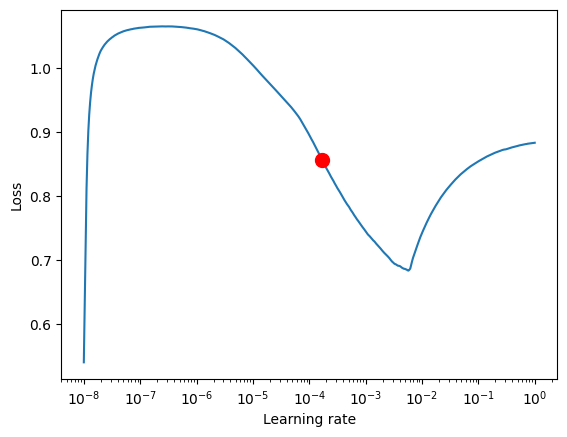

In [12]:
tuner = Tuner(trainer)

# Run learning rate finder
lr_finder = tuner.lr_find(model, data_module, num_training=500, mode="exponential")

# Plot with
fig = lr_finder.plot(suggest=True)
fig.show()

# Pick point based on plot, or get suggestion
if lr_finder:
    model.learning_rate = lr_finder.suggestion()

In [13]:
print("Lightning Training the model...")

trainer.fit(model, data_module)

Lightning Training the model...


/home/jpinn/.local/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/jpinn/asl-fingerspelling-recognition/src/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type              | Params
--------------------------------------------------
0 | enc_emb     | LandmarkEmbedding | 3.2 M 
1 | dec_emb     | TokenEmbedding    | 39.3 K
2 | transformer | Transformer       | 10.8 M
3 | linear      | Linear            | 19.4 K
4 | loss        | CrossEntropyLoss  | 0     
--------------------------------------------------
14.1 M    Trainable params
0         Non-trainable params
14.1 M    Total params
56.363    Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

# Model Note, Reference, Brainstorm

https://www.youtube.com/watch?v=4Bdc55j80l8

## Input Embedding Layer

The phrase must be vectorized (our case is chars)
We must add Positional Encoding to create Positional Input Embeddings

## Encoder Layer

Two sub-modules:

### Attention

#### Self-Attention

3 Distinct fully connected layers

- Query, Key, Value
- A dot product of the Query and Key matrices is computed to create a score matrix.
- The score matrix a table that dictatates how much value each word or char should be given, compared to the other words or chars in the input sequence. Higher score = more important. = more focus.
- The score matrix is normalized by dividing by the square root of the dimension of the key vectors.
- The score matrix is divided by the square root of the dimension of the key vectors which gives the scaled scores.
- The scaled scores are then passed through a softmax function to receive the attention weights.
- Multiply attention weights by value matrix to get the output vector of the self-attention layer.
- Linear layer to process.

#### Multi-headed Attention

The query, key, and value is split into N heads.

- Each vector goes through the attention layer as normal
- The output of all heads is concatenated into a single vector
- Each head is given a different representation of the input sequence, allowing the model to simultaneously attend to information from different representation subspaces.
- Each head in theory should learn to attend to different parts of the input sequence, and thus overall learn more of the input sequence.

### Residual Connection, Layer Normalization, and Feed Forward Layer

- The Multi-headed attention output vector is added to the original input vector to the sub-layer, which is called a residual connection.
- This output is then normalized by layer normalization.
- This enters a feed forward network, which is a simple 2 layer fully connected network with a ReLU activation in between.
- The output of that is added again to the original input, to be normalized again. Like before with the multi-headed attention.

## Decoder Layer

### Output Embedding Layer and Positional Encoding

- The output goes through an embedding layer to get the position embeddings.
- This enters the first multi-headed attention layer.
- The scaled scores are added to a look ahead mask, which prevents the decoder from attending to future tokens.
- This happens when the softmax makes future tokens 0, so no attention is given to them.
- All the heads are combined to create a masked output layer.

The second multi-headed attention layer has the query and key of the encoder output, and the value of the previous multi-headed attention layer output value.

A final feed forward network is applied to the output of the second multi-headed attention layer.

### Classifier, softmax, and output

The feed forward output enters a linear classifier.

Classifier output enters softmax to get the probability score of each class (char). The index of the highest probability is the predicted char.

Output is added to a list of decoded outputs until the end token is reached.

This whole structure can be stacked N layers high. The output of the final encoder, is input into all the decoder layers, who are taking the input from the previous decoder layer.


# Notes

```python
import tensorflow_addons as tfa
pbar = tfa.callbacks.TQDMProgressBar()
model.fit(…,callbacks=[pbar])
# TQDMProgressBar() also works with evaluate()
model.evaluate(…,callbacks=[pb
```

Check!

## Multiprocessing

```python
with Pool(workers) as pool:
    results = list(tqdm(pool.imap(worker,thread_list, total=len(thread_list))
                        ar])
```

Check!

## Padding strategies

1. No Padding with <EOS> token: This is the most efficient and elegant approach for Transformers.

2. Full Padding: Pad all phrases (and potentially feature sequences) to a fixed maximum length using a constant value or specific technique. This can be simpler to implement but introduces unnecessary computational overhead and potential information distortion due to large padding sections.

3. Full Padding with Masking: This combines the simplicity of full padding with the benefits of masking. While you pad all sequences to a fixed length, you apply masking during training to prevent the model from attending to the padded regions. This can be a good compromise if your model struggles with highly variable sequence lengths but you still want to avoid the downsides of excessive padding.
